In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import rcParams

import xgboost
import shap

In [29]:
no = pd.read_csv('symptom_no_refined.csv')
yes = pd.read_csv('symptom_yes_refined.csv')

# 환자와 정상을 구분 짓는 컬럼추가
no['class'] = 0
yes['class'] = 1

# 환자와 정상 데이터 합치기
data = pd.concat([yes,no])

# 새로운 컬럼 추가 (좌우 비율)
data["Stride_ratio"] = data["Stride_L"] / data["Stride_R"]
data["Step_ratio"] = data["Step_L"] / data["Step_R"]
data["SS_ratio"] = data["SS_L"] / data["SS_R"]
data["DS_ratio"] = data["DS_L"] / data["DS_R"]
data["Time_Toe_ratio"] = data["Time_Toe_L"] / data["Time_Toe_R"]
data["ROM_IE_ratio"] = data["ROM_IE_L"] / data["ROM_IE_R"]
data["ROM_DP_ratio"] = data["ROM_DP_L"] / data["ROM_DP_R"]
data["ROM_AA_ratio"] = data["ROM_AA_L"] / data["ROM_AA_R"]

# 학습에 사용할 x 컬럼 정의
use_columns_ls = ['Height','Weight','BMI','N_Speed','Cadence','Stride_L','Stride_R',
                        'Step_L','Step_R','SS_L','SS_R','DS_L','DS_R','Time_Toe_L','Time_Toe_R',
                        'Stride_ratio','Step_ratio','SS_ratio','DS_ratio','Time_Toe_ratio'
                        ,'class','Diagnosis', 'Gender']
# use_columns_ls = ['Height','Weight','BMI','N_Speed','Cadence','Stride_L','Stride_R',
#                         'Step_L','Step_R','SS_L','SS_R','DS_L','DS_R','Time_Toe_L','Time_Toe_R',
#                         'ROM_IE_L','ROM_IE_R','ROM_DP_L','ROM_DP_R','ROM_AA_L','ROM_AA_R','GA','PCI',
#                         'Stride_ratio','Step_ratio','SS_ratio','DS_ratio','Time_Toe_ratio',
#                         'ROM_IE_ratio','ROM_DP_ratio','ROM_AA_ratio','class','Diagnosis', 'Gender']
data = data.loc[:, use_columns_ls]

# 성별을 숫자로 변경하여 구분
df_gender = pd.get_dummies(data['Gender'])
data.drop(['Gender'],axis=1,inplace=True)
data = pd.concat([data, df_gender],axis=1)

# 질병코드 분류
data['Diagnosis'] = data['Diagnosis'].astype(np.str).tolist()

data.reset_index(inplace=True,drop=True)

for i in range(1,10):
    data[f'Diagnosis_{i}'] = 0

for i in range(len(data)):
    if '1' in data.loc[i, 'Diagnosis']:
        data.loc[i, 'Diagnosis_1'] = 1

    if '2' in data.loc[i,'Diagnosis']:
        data.loc[i,'Diagnosis_2'] = 1

    if '3' in data.loc[i,'Diagnosis']:
        data.loc[i,'Diagnosis_3'] = 1

    if '4' in data.loc[i,'Diagnosis']:
        data.loc[i,'Diagnosis_4'] = 1

    if '5' in data.loc[i,'Diagnosis']:
        data.loc[i,'Diagnosis_5'] = 1

    if '6' in data.loc[i,'Diagnosis']:
        data.loc[i,'Diagnosis_6'] = 1

    if '7' in data.loc[i,'Diagnosis']:
        data.loc[i,'Diagnosis_7'] = 1

    if '8' in data.loc[i,'Diagnosis']:
        data.loc[i,'Diagnosis_8'] = 1

    if '9' in data.loc[i,'Diagnosis']:
        data.loc[i,'Diagnosis_9'] = 1

patient = data[data['class'] == 1]
patient = patient.drop(['Diagnosis'],axis=1)
data = data.drop(['Diagnosis'],axis=1)

In [3]:
def shap_summary(data_, gender='total', target='class'):
    
    use_columns_ls = ['Height','Weight','BMI','N_Speed','Cadence','Stride_L','Stride_R',
                        'Step_L','Step_R','SS_L','SS_R','DS_L','DS_R','Time_Toe_L','Time_Toe_R',
                        'Stride_ratio','Step_ratio','SS_ratio','DS_ratio','Time_Toe_ratio',
                     'F', 'M',]

    # 전체를 학습할지 남,여 구분해서 학습할지 결정
    if gender == 'F':
        data_ = data_[data_['F'] == 1]
    elif gender == 'M':
        data_ = data_[data_['M'] == 1]
    else : 
        data_ = data_.drop(['F','M'], axis=1)

    # split (x, y)
    x_data = data_.loc[:, use_columns_ls]
    y_data = data_.loc[:, target]

    # create model
    model = xgboost.XGBClassifier(max_depth=4)
    model.fit(x_data, y_data)

    # view plot first
    shap.initjs()
    explainer = shap.TreeExplainer(model)
    shap_values = explainer.shap_values(x_data)
    shap.summary_plot(shap_values, x_data,max_display=7,)

    #view plot second
    rcParams['figure.figsize'] = 100,200
    xgboost.plot_tree(model)
    plt.show()

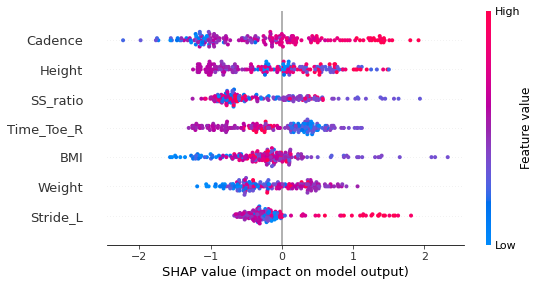

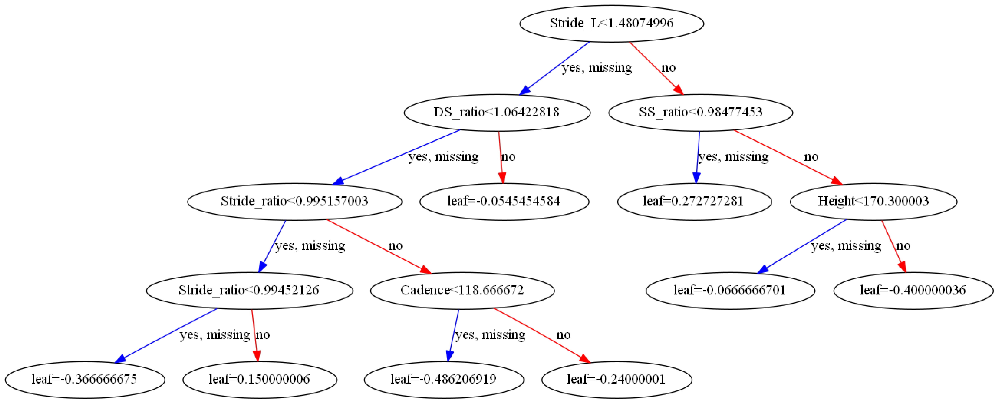

In [30]:
shap_summary(patient, gender='M', target='Diagnosis_3')

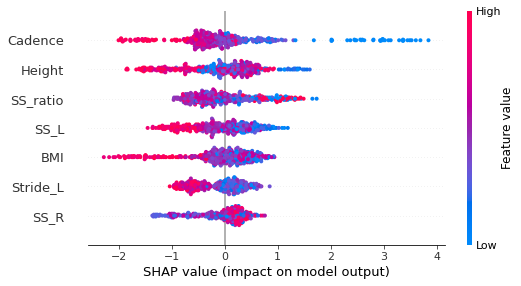

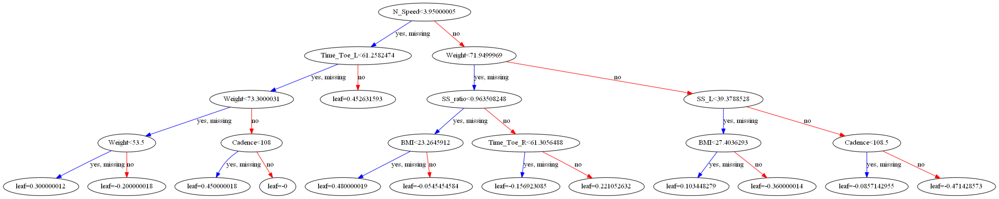

In [4]:
shap_summary(data, gender='M', target='class')

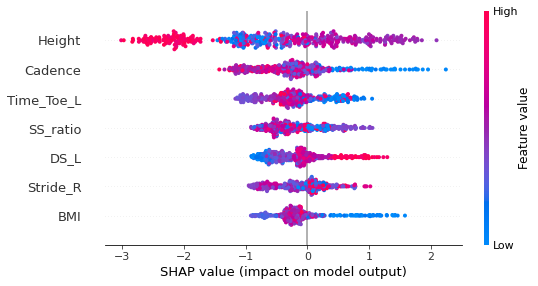

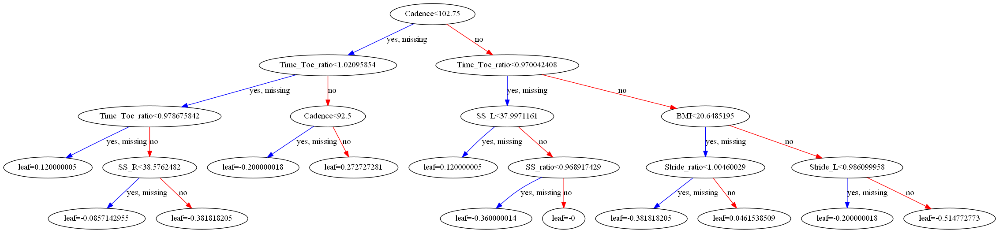

In [5]:
shap_summary(data, gender='M', target='Diagnosis_1')

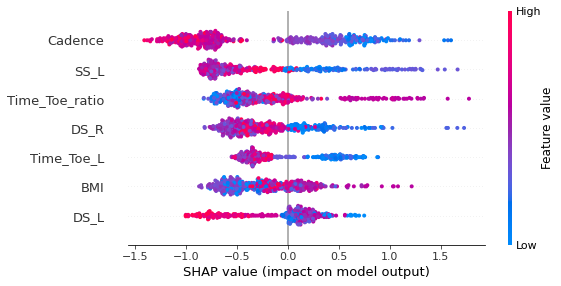

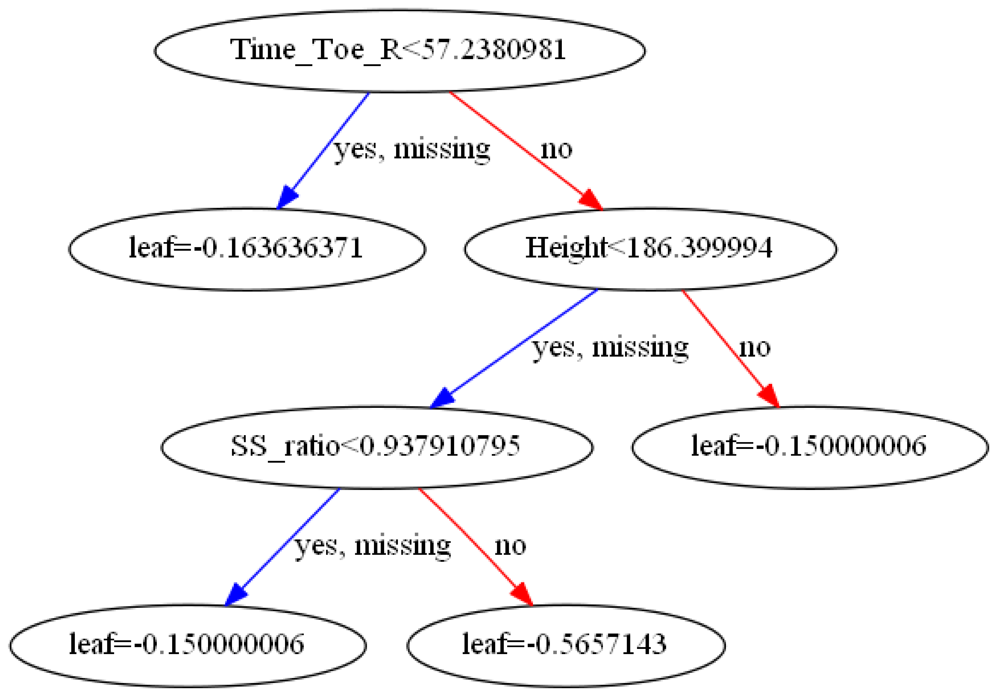

In [6]:
shap_summary(data, gender='M', target='Diagnosis_2')

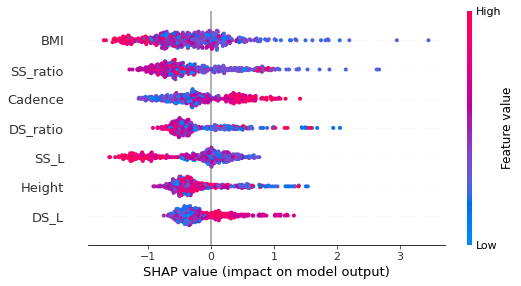

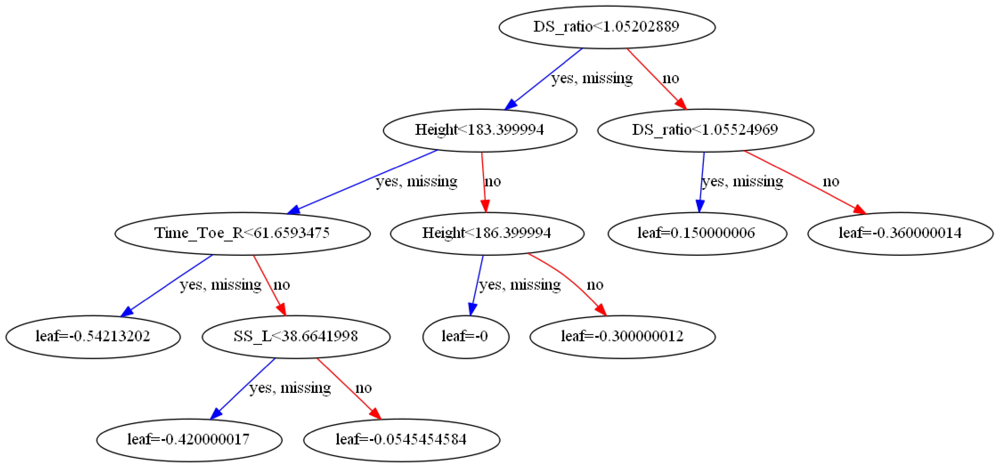

In [7]:
shap_summary(data, gender='M', target='Diagnosis_3')

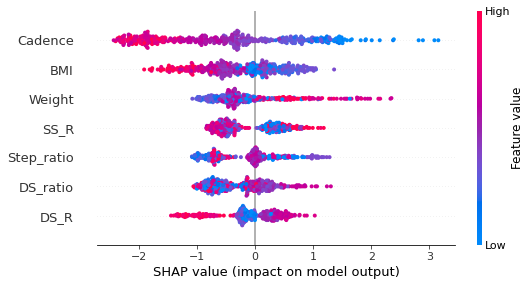

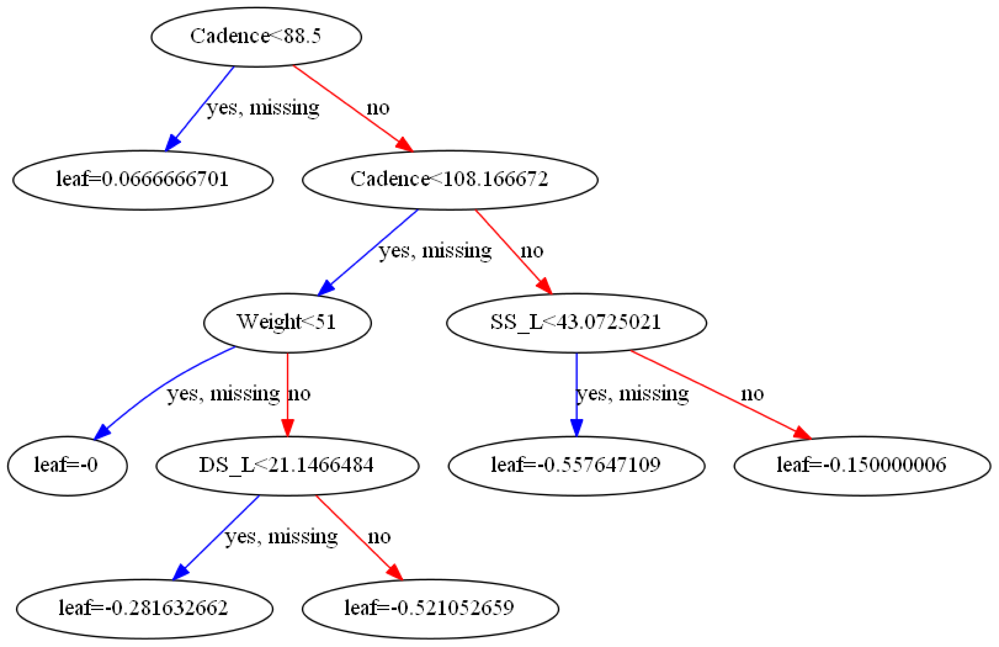

In [8]:
shap_summary(data, gender='M', target='Diagnosis_4')

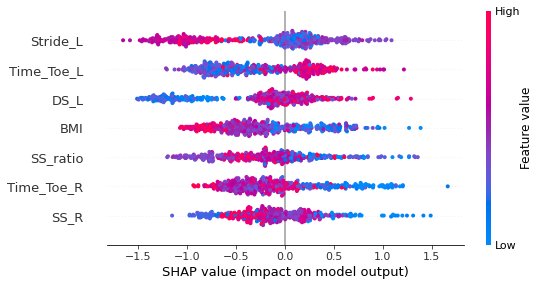

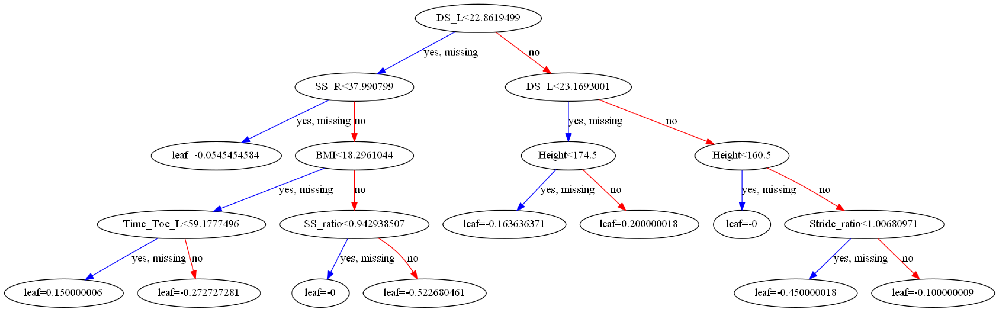

In [9]:
shap_summary(data, gender='M', target='Diagnosis_5')

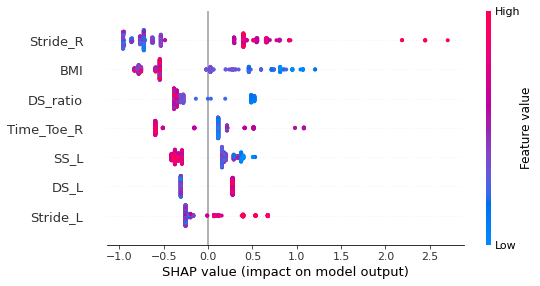

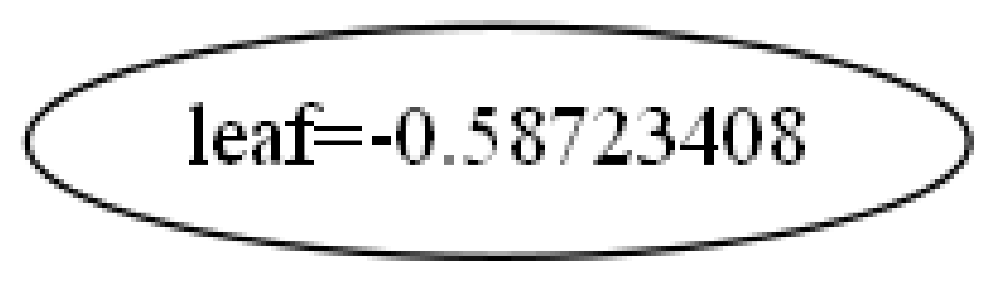

In [10]:
shap_summary(data, gender='M', target='Diagnosis_6')

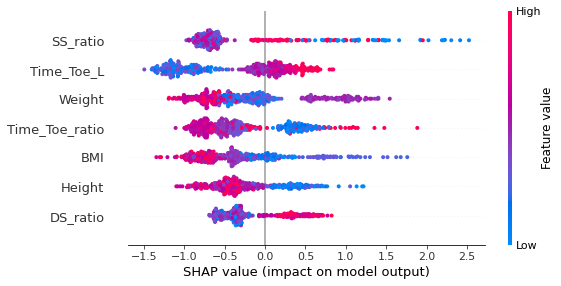

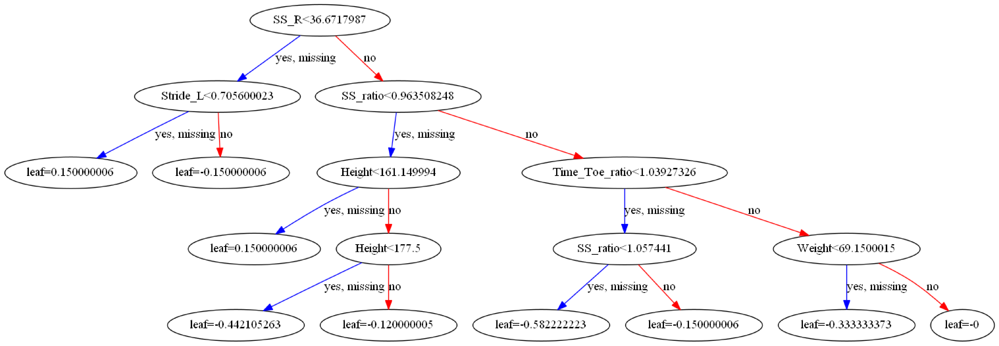

In [11]:
shap_summary(data, gender='M', target='Diagnosis_7')

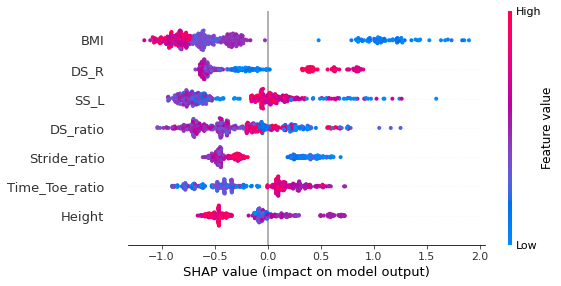

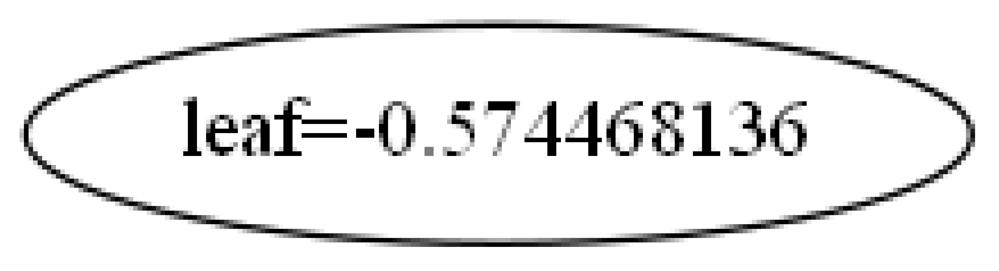

In [12]:
shap_summary(data, gender='M', target='Diagnosis_8')

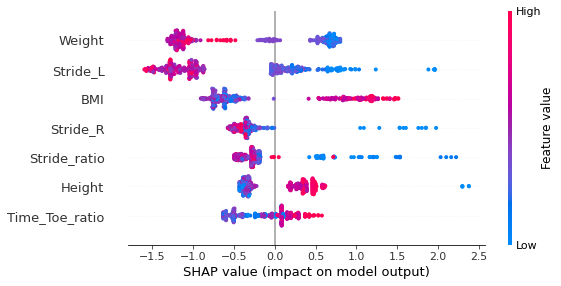

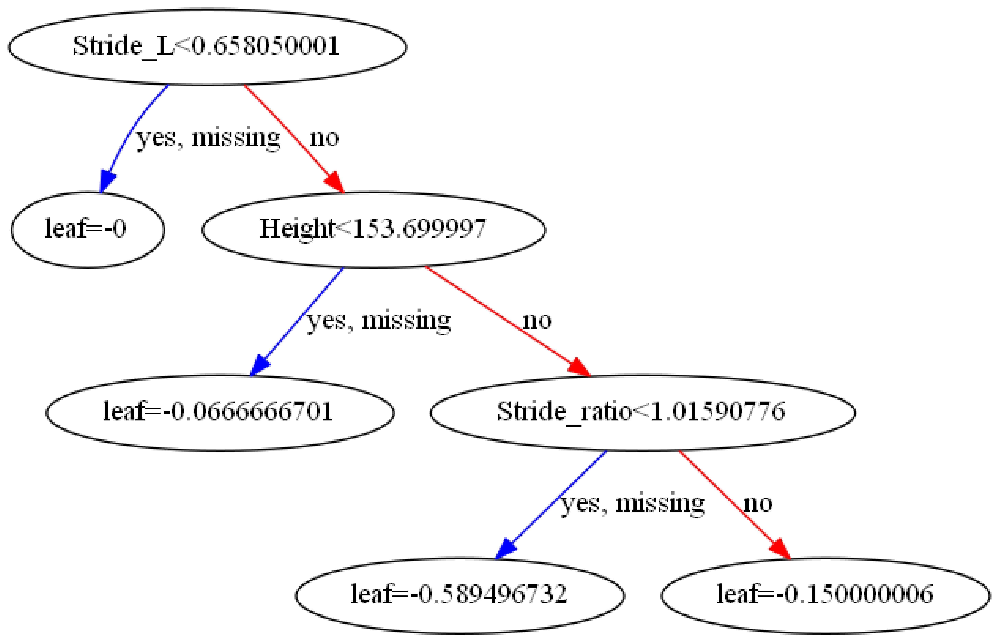

In [13]:
shap_summary(data, gender='M', target='Diagnosis_9')

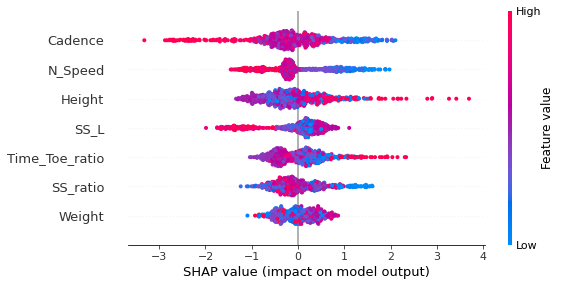

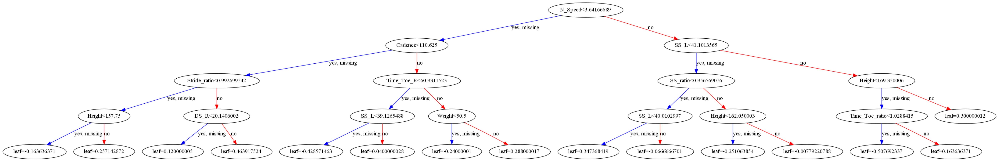

In [14]:
shap_summary(data, gender='F', target='class')

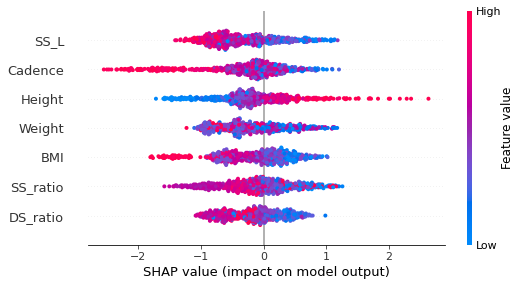

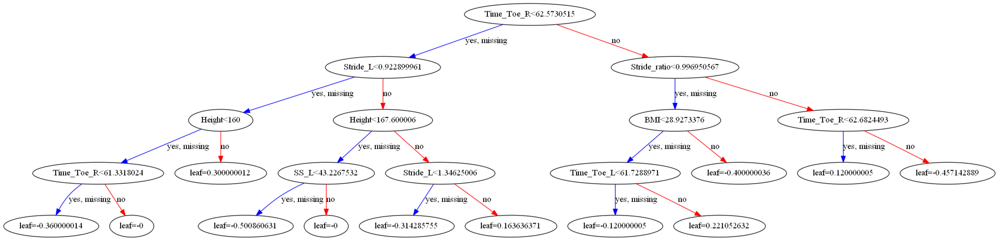

In [15]:
shap_summary(data, gender='F', target='Diagnosis_1')

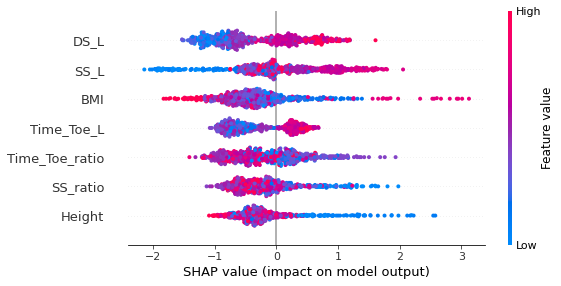

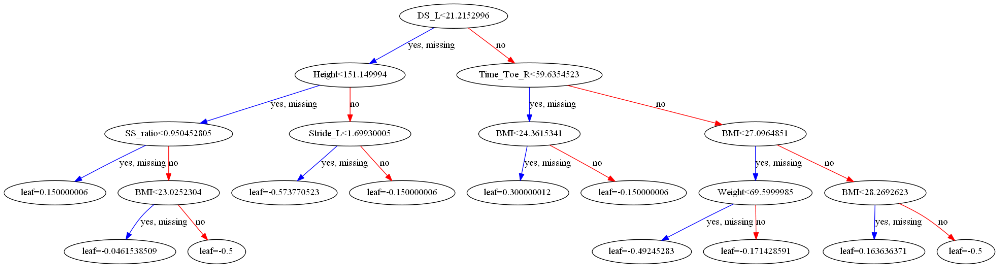

In [16]:
shap_summary(data, gender='F', target='Diagnosis_2')

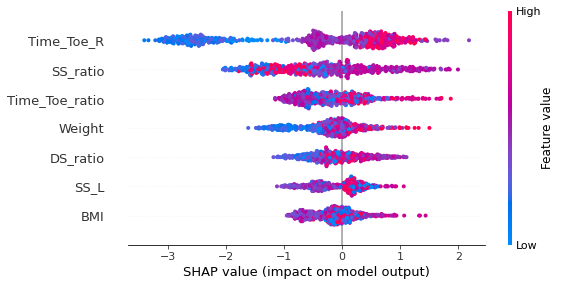

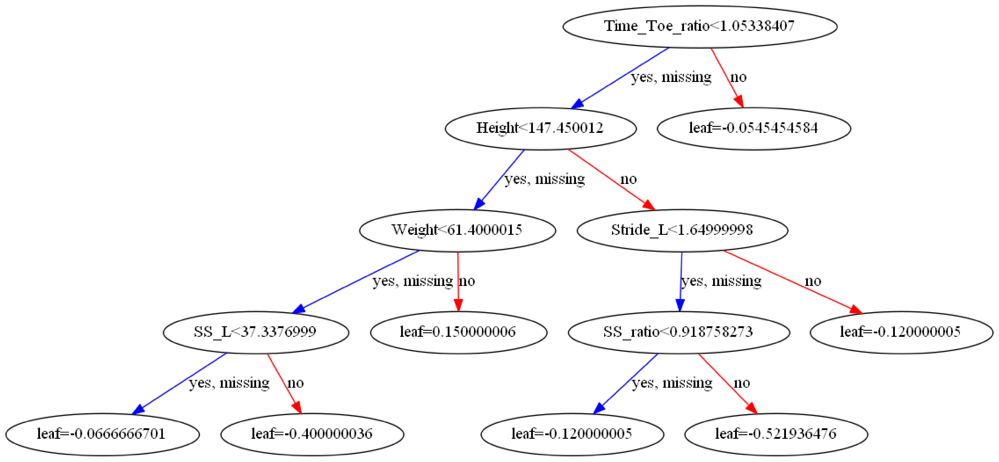

In [17]:
shap_summary(data, gender='F', target='Diagnosis_3')

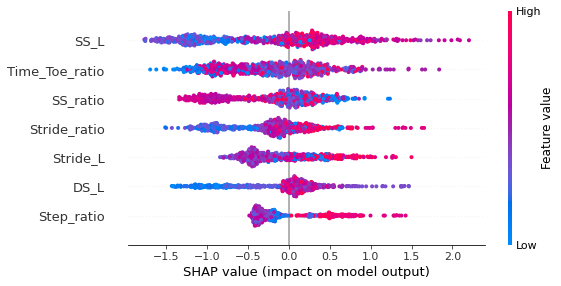

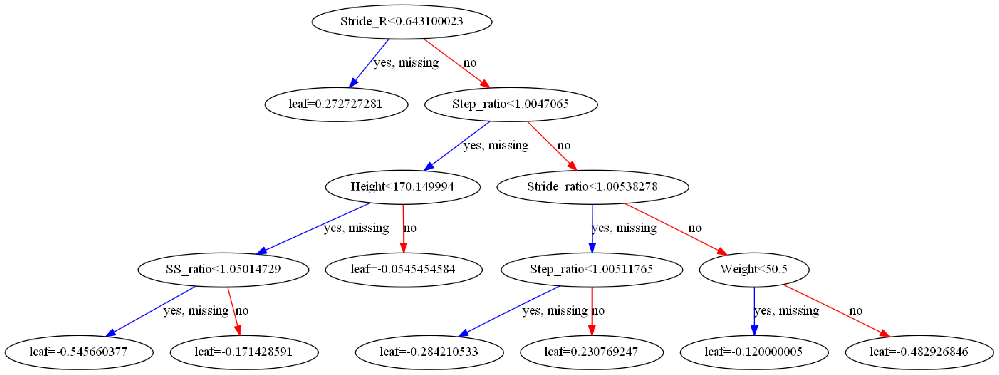

In [18]:
shap_summary(data, gender='F', target='Diagnosis_4')

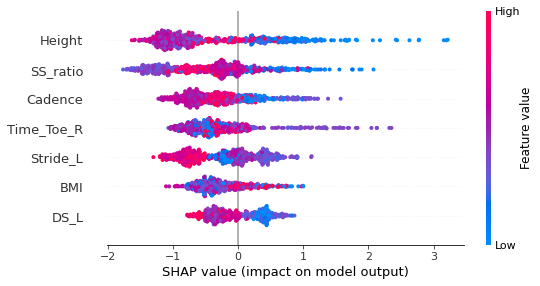

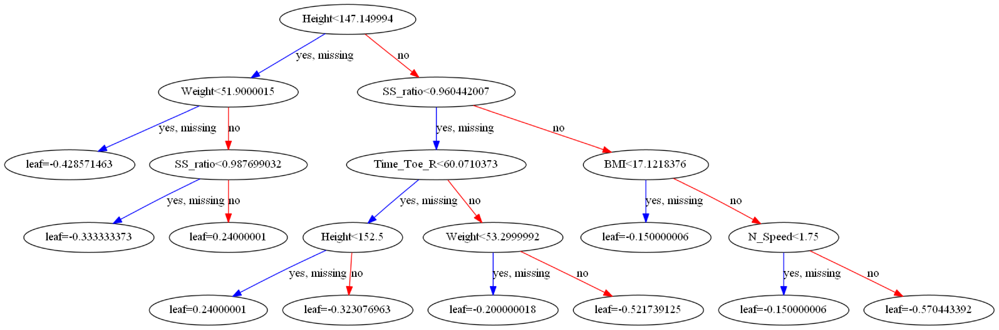

In [19]:
shap_summary(data, gender='F', target='Diagnosis_5')

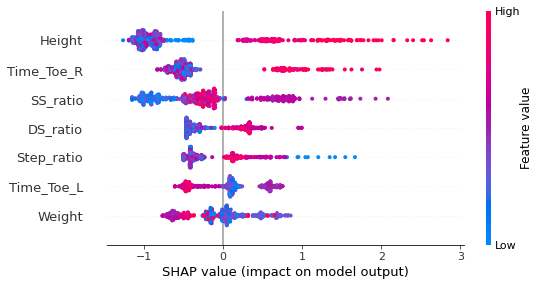

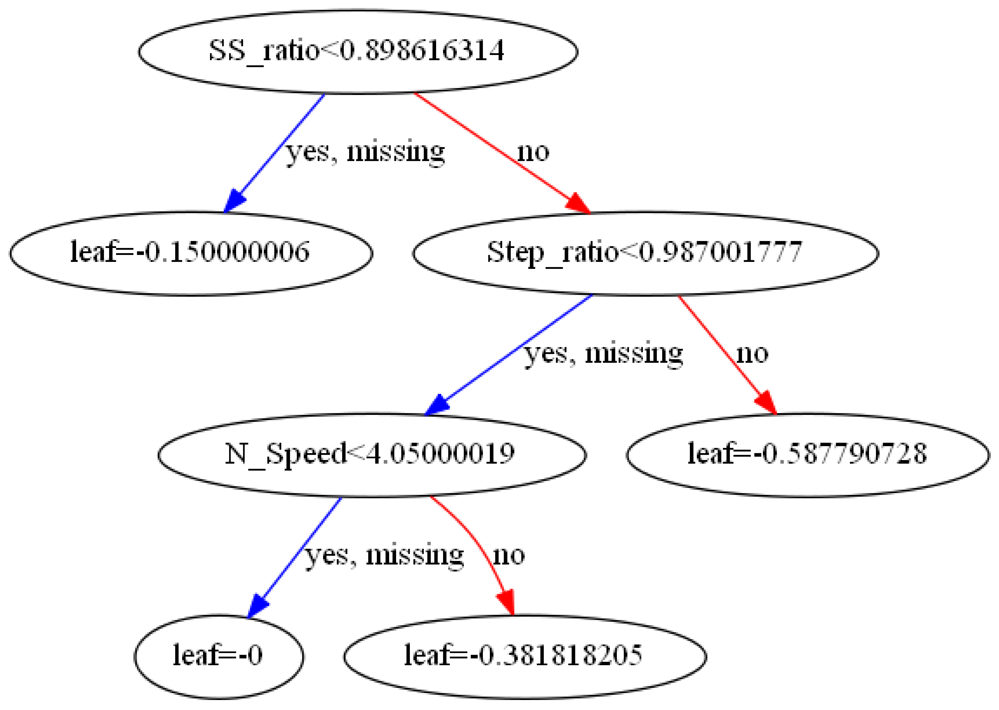

In [20]:
shap_summary(data, gender='F', target='Diagnosis_6')

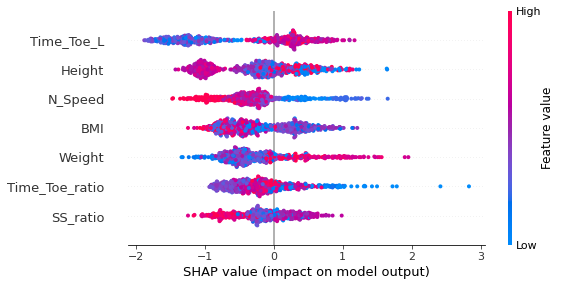

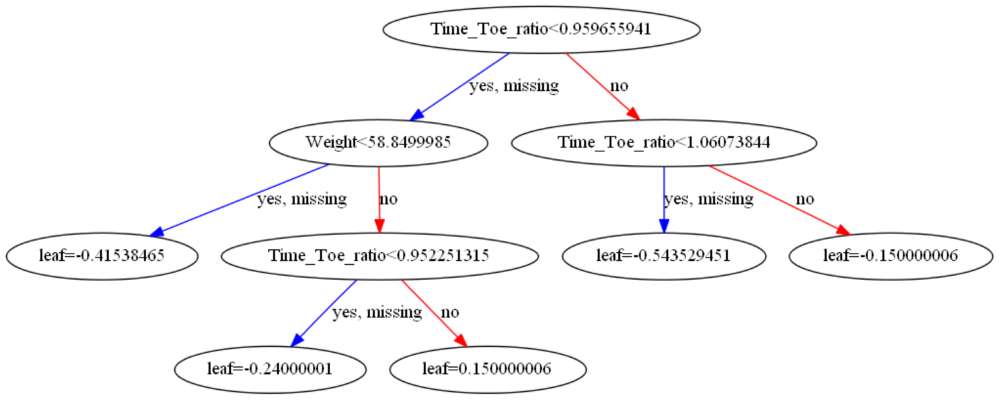

In [21]:
shap_summary(data, gender='F', target='Diagnosis_7')

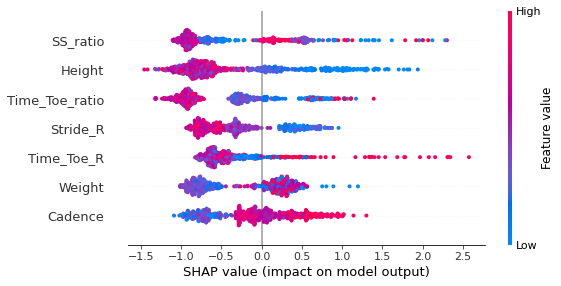

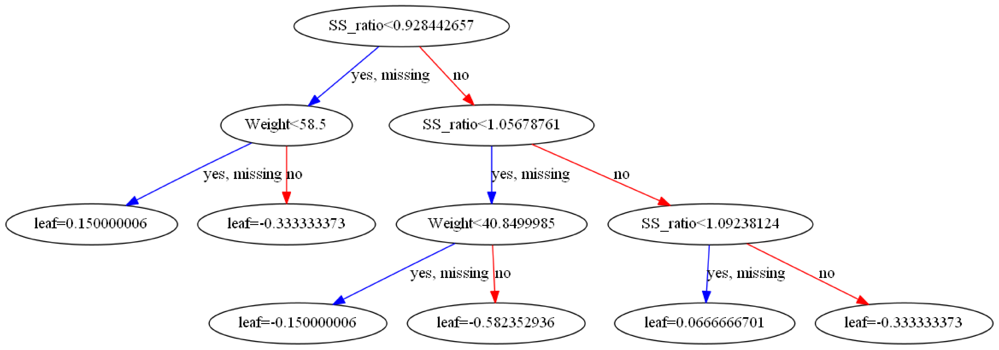

In [22]:
shap_summary(data, gender='F', target='Diagnosis_8')

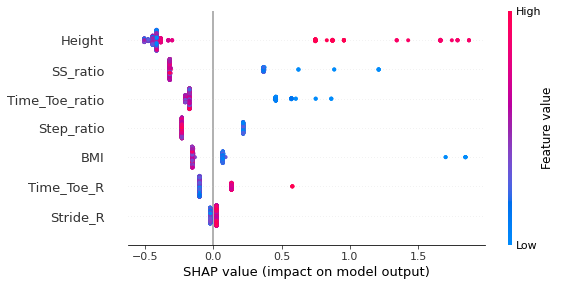

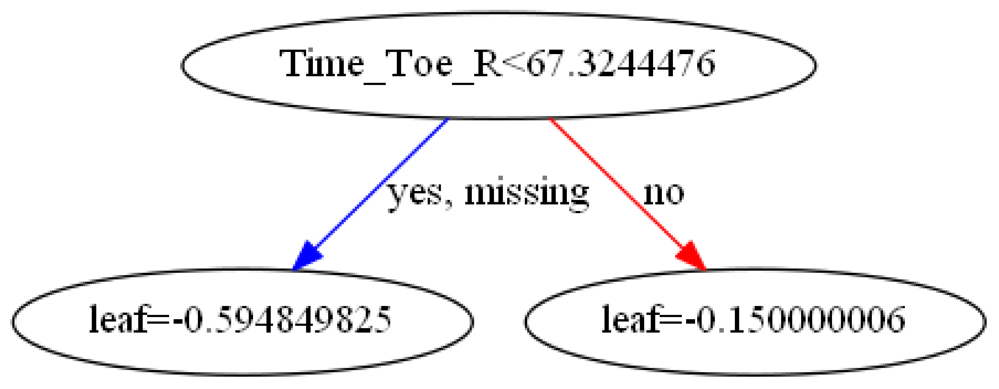

In [23]:
shap_summary(data, gender='F', target='Diagnosis_9')